# Questions to explore:
- Has the pregnancy, abortion and birth rates increased or receded over the years?
- What age range has the least and most abortion, pregnancy and birth rates?
- What state has the least and most abortion, pregnancy and birth rates?

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams



df = pd.read_csv('https://query.data.world/s/ta5pgehr4e5g4qckn2z4awervc2yhc')
df

,Year,State,Metric,Age Range,"Events per 1,000 women"
0,1988,AL,Abortion Rate,15-17,24.0
1,1992,AL,Abortion Rate,15-17,19.1
2,1996,AL,Abortion Rate,15-17,12.5
3,2000,AL,Abortion Rate,15-17,9.3
4,2005,AL,Abortion Rate,15-17,7.0
...,...,...,...,...,...
23167,2012,WY,Pregnancy Rate,Total,93.1
23168,2013,WY,Pregnancy Rate,Total,91.5
23169,2014,WY,Pregnancy Rate,Total,92.5
23170,2015,WY,Pregnancy Rate,Total,92.9


**Check for duplicate and null values**

In [2]:
# check duplicates 
df.duplicated().sum()

0

In [3]:
# check nulls
df.isnull().sum()

Year                      0
State                     0
Metric                    0
Age Range                 0
Events per 1,000 women    0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23172 entries, 0 to 23171
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Year                    23172 non-null  int64  
 1   State                   23172 non-null  object 
 2   Metric                  23172 non-null  object 
 3   Age Range               23172 non-null  object 
 4   Events per 1,000 women  23172 non-null  float64
dtypes: float64(1), int64(1), object(3)
memory usage: 905.3+ KB


**Change column name**

In [5]:
df.rename(columns = {'Events per 1,000 women':'Rate'}, inplace = True)
df.head()

,Year,State,Metric,Age Range,Rate
0,1988,AL,Abortion Rate,15-17,24.0
1,1992,AL,Abortion Rate,15-17,19.1
2,1996,AL,Abortion Rate,15-17,12.5
3,2000,AL,Abortion Rate,15-17,9.3
4,2005,AL,Abortion Rate,15-17,7.0


**To check the number of states with records. Initial list contained 52 states.**

In [6]:
no_of_states = df["State"].nunique()
print(no_of_states)

states = list(df["State"].unique())
print(states)

52
['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'US', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY']


**To check the age ranges recorded. Recorded included redundant/irrelevant ranges ("15-17", "18-19", and "Total")**

15-17 and 18-19 are contained in 15-19

In [7]:
no_of_age_groups = df["Age Range"].nunique()
print(no_of_age_groups)

age_range = list(df["Age Range"].unique())
age_range

9


['15-17', '35-39', '40+', '30-34', '25-29', '20-24', '15-19', 'Total', '18-19']

**Subset table to remove:**
1. Entries where state is US. It is not a valid state. The US has 50 states. 50 states plus the Capital makes 51.

2. Redundant age ranges

In [8]:
age_range.remove('15-17')
age_range.remove('18-19')
age_range.remove('Total')
print(age_range)

states.remove("US")
print(states)

['35-39', '40+', '30-34', '25-29', '20-24', '15-19']
['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY']


In [9]:
new_df = df[df["Age Range"].isin(age_range) & df["State"].isin(states)]
new_df

,Year,State,Metric,Age Range,Rate
857,1988,AL,Birth Rate,35-39,19.8
858,1992,AL,Birth Rate,35-39,20.4
859,1996,AL,Birth Rate,35-39,23.7
860,2000,AL,Birth Rate,35-39,26.4
861,2005,AL,Birth Rate,35-39,29.4
...,...,...,...,...,...
22307,2012,WY,Pregnancy Rate,40+,11.6
22308,2013,WY,Pregnancy Rate,40+,11.9
22309,2014,WY,Pregnancy Rate,40+,11.1
22310,2015,WY,Pregnancy Rate,40+,12.5


In [10]:
# check to see if changes were made
print(len(new_df["State"].unique()))
new_df["State"].unique()

51


array(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
       'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
       'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'], dtype=object)

In [11]:
print(len(new_df["Age Range"].unique()))
new_df["Age Range"].unique()

6


array(['35-39', '40+', '30-34', '25-29', '20-24', '15-19'], dtype=object)

**Check metric:**

In [12]:
new_df["Metric"].unique()

array(['Birth Rate', 'Abortion Rate', 'Pregnancy Rate'], dtype=object)

To get data for ONLY abortion rate:

In [13]:
abortion_df = new_df[new_df["Metric"] == "Abortion Rate"]
abortion_df

,Year,State,Metric,Age Range,Rate
8597,1988,AL,Abortion Rate,15-19,31.4
8598,1992,AL,Abortion Rate,15-19,27.2
8599,1996,AL,Abortion Rate,15-19,19.9
8600,2000,AL,Abortion Rate,15-19,15.5
8601,2005,AL,Abortion Rate,15-19,11.9
...,...,...,...,...,...
15451,2012,WY,Abortion Rate,40+,2.2
15452,2013,WY,Abortion Rate,40+,1.8
15453,2014,WY,Abortion Rate,40+,1.8
15454,2015,WY,Abortion Rate,40+,1.9


To get data for ONLY pregnancy rate:

In [14]:
pregnancy_df = new_df[new_df["Metric"] == "Pregnancy Rate"]
pregnancy_df

,Year,State,Metric,Age Range,Rate
16313,1988,AL,Pregnancy Rate,15-19,110.5
16314,1992,AL,Pregnancy Rate,15-19,116.4
16315,1996,AL,Pregnancy Rate,15-19,102.4
16316,2000,AL,Pregnancy Rate,15-19,89.8
16317,2005,AL,Pregnancy Rate,15-19,70.8
...,...,...,...,...,...
22307,2012,WY,Pregnancy Rate,40+,11.6
22308,2013,WY,Pregnancy Rate,40+,11.9
22309,2014,WY,Pregnancy Rate,40+,11.1
22310,2015,WY,Pregnancy Rate,40+,12.5


To get data for ONLY birth rate:

In [15]:
birth_df = new_df[new_df["Metric"] == "Birth Rate"]
birth_df

,Year,State,Metric,Age Range,Rate
857,1988,AL,Birth Rate,35-39,19.8
858,1992,AL,Birth Rate,35-39,20.4
859,1996,AL,Birth Rate,35-39,23.7
860,2000,AL,Birth Rate,35-39,26.4
861,2005,AL,Birth Rate,35-39,29.4
...,...,...,...,...,...
6012,2012,WY,Birth Rate,15-19,34.9
6013,2013,WY,Birth Rate,15-19,29.9
6014,2014,WY,Birth Rate,15-19,30.8
6015,2015,WY,Birth Rate,15-19,28.8


Looking at the record count for each state:

In [16]:
abortion_df.groupby(["State"])[["Year", "Age Range", "Metric", "Rate"]].count()

,Year,Age Range,Metric,Rate
State,,,,
AK,96,96,96,96
AL,96,96,96,96
AR,96,96,96,96
AZ,96,96,96,96
CA,96,96,96,96
CO,96,96,96,96
CT,96,96,96,96
DC,78,78,78,78
DE,96,96,96,96


In [17]:
pregnancy_df.groupby(["State"])[["Year", "Age Range", "Metric", "Rate"]].count()

,Year,Age Range,Metric,Rate
State,,,,
AK,96,96,96,96
AL,96,96,96,96
AR,96,96,96,96
AZ,96,96,96,96
CA,96,96,96,96
CO,96,96,96,96
CT,96,96,96,96
DC,78,78,78,78
DE,96,96,96,96


In [18]:
birth_df.groupby(["State"])[["Year", "Age Range", "Metric", "Rate"]].count()

,Year,Age Range,Metric,Rate
State,,,,
AK,96,96,96,96
AL,96,96,96,96
AR,96,96,96,96
AZ,96,96,96,96
CA,96,96,96,96
CO,96,96,96,96
CT,96,96,96,96
DC,96,96,96,96
DE,96,96,96,96


**The count above shows that DC is missing some records for abortion and pregnancy rates, let's look at it:**

In [19]:
abortion_rate_per_state = abortion_df.pivot_table(values="Rate", columns="Year", index=["State", "Age Range"])
abortion_rate_per_state.columns.name = None
# abortion_rate_per_state.reset_index(inplace=True)
# print(len(abortion_rate_per_state["State"].unique()))
# print(abortion_rate_per_state["State"].unique())
abortion_rate_per_state.loc["DC"]

,1988,1992,1996,2000,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Age Range,,,,,,,,,,,,,,,,
15-19,NaN,NaN,NaN,52.6,54.3,50.0,40.1,46.8,38.2,32.8,25.7,20.4,26.5,21.7,16.5,12.0
20-24,NaN,NaN,NaN,67.1,69.2,58.2,51.4,54.2,46.6,37.1,34.6,35.0,41.2,44.9,38.4,27.7
25-29,NaN,NaN,NaN,51.4,55.0,49.7,42.5,43.7,36.5,25.8,20.0,22.9,21.3,22.6,24.9,18.4
30-34,NaN,NaN,NaN,31.1,37.1,34.0,35.2,33.5,26.6,20.3,17.3,17.6,16.7,15.5,16.4,13.7
35-39,NaN,NaN,NaN,19.4,24.4,24.0,25.2,25.8,17.9,16.4,12.6,15.8,12.5,12.2,10.3,11.0
40+,NaN,NaN,NaN,6.5,9.7,9.3,8.7,11.7,8.5,7.1,3.6,4.3,5.4,6.5,4.0,5.3


In [20]:
pregnancy_rate_per_state = pregnancy_df.pivot_table(values="Rate", columns="Year", index=["State", "Age Range"])
pregnancy_rate_per_state.columns.name = None
# abortion_rate_per_state.reset_index(inplace=True)
# print(len(abortion_rate_per_state["State"].unique()))
# print(abortion_rate_per_state["State"].unique())
pregnancy_rate_per_state.loc["DC"]

,1988,1992,1996,2000,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Age Range,,,,,,,,,,,,,,,,
15-19,NaN,NaN,NaN,121.8,110.2,112.7,104.6,112.9,100.2,90.8,79.7,69.3,67.7,58.6,49.2,41.9
20-24,NaN,NaN,NaN,154.5,152.3,139.3,130.3,129.9,116.3,105.2,106.3,107.9,113.7,119.8,109.5,95.2
25-29,NaN,NaN,NaN,127.4,133.3,132.2,121.5,121.8,110.3,91.4,78.2,81.0,74.5,78.0,80.1,75.9
30-34,NaN,NaN,NaN,117.0,129.5,131.3,136.4,140.0,127.5,124.2,118.6,111.9,113.6,110.1,108.2,106.3
35-39,NaN,NaN,NaN,77.4,99.8,99.3,111.6,111.5,101.8,98.7,97.9,104.3,97.5,99.7,98.8,99.3
40+,NaN,NaN,NaN,24.8,33.2,34.1,31.9,36.2,34.4,33.9,31.3,36.0,34.3,34.1,33.3,35.2


The table above shows that DC is missing data in 1988, 1992 and 1996. For now, I will leave this data as is. My next operation involves taking yearly mean for each age range across all cities. Since only one city is affected, my results would work fine.

In [21]:
# list of years in dataframe
years = list(abortion_df.Year.unique())
years

[1988,
 1992,
 1996,
 2000,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016]

In [22]:
# function to pivot table for each metric to get mean rate per year, per age group
def pivot_metric_table(df):
  """
    df(DataFrame): abortion_df, pregnancy_df or birth_df
  """
  metric_per_year = df.pivot_table(values="Rate", columns="Age Range", index="Year")
  metric_per_year.columns.name = None
  metric_per_year.reset_index(inplace=True)
  metric_per_year.set_index("Year", inplace=True)
  return metric_per_year

In [23]:
# function to plot trend for each metric trend per year per age group
def plot_metric_trend(df, metric):
  """
    df(DataFrame): abortion_df, pregnancy_df or birth_df
    metric(str): "abortion", "pregnancy" or "birth"
  """
  sns.set_style("whitegrid")
  metric_graph = pivot_metric_table(df).plot(figsize=(10, 8))
  plt.xticks(years, rotation=90)
  plt.xlim([1988, 2016])
  plt.xlabel("Year", labelpad=20)
  plt.ylabel(f"{metric.title()} Rate per 1000 Women", labelpad=10)
  plt.title(f"{metric.upper()} TREND ACROSS DIFFERENT AGE GROUPS IN THE US", pad=10)
  plt.legend(loc="upper right", bbox_to_anchor=(1.14, 1))
  plt.show()

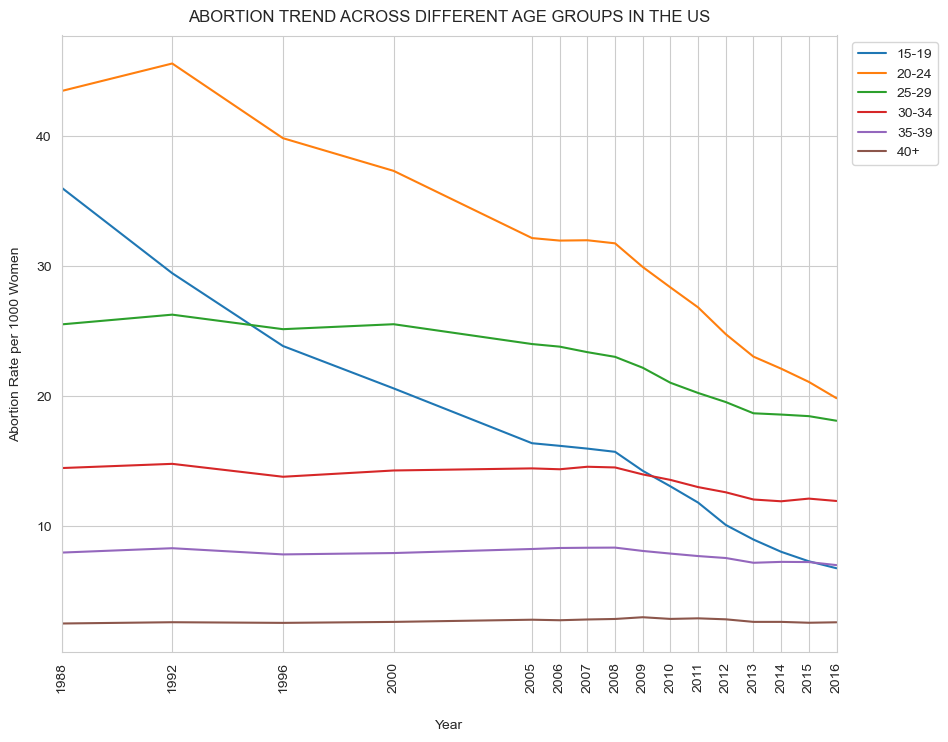

In [24]:
plot_metric_trend(abortion_df, "abortion")

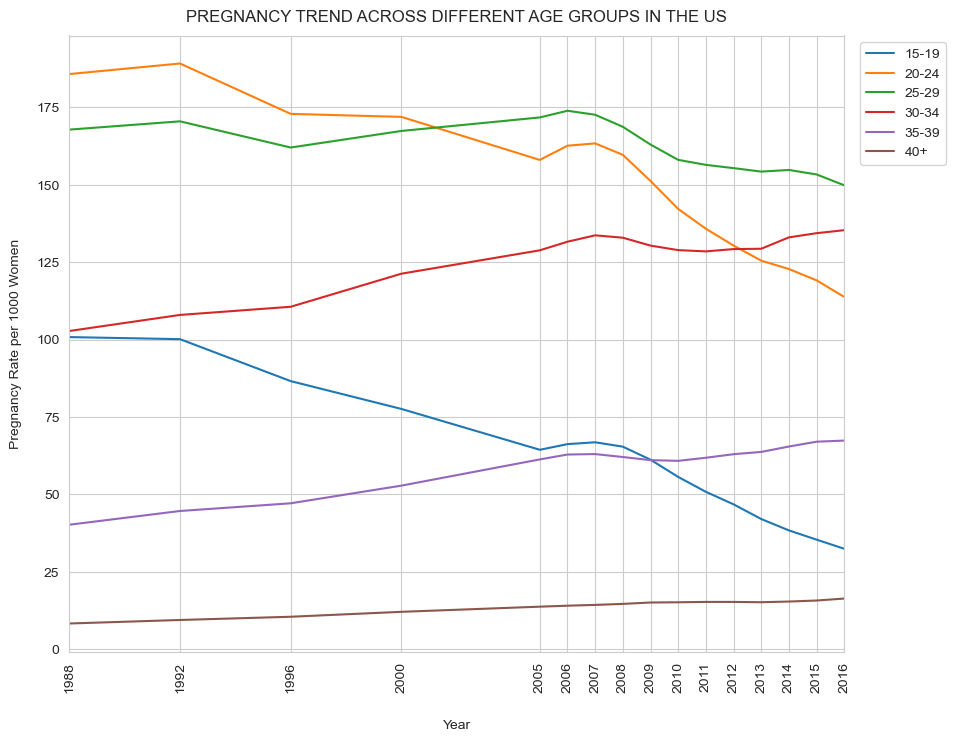

In [25]:
plot_metric_trend(pregnancy_df, "pregnancy")

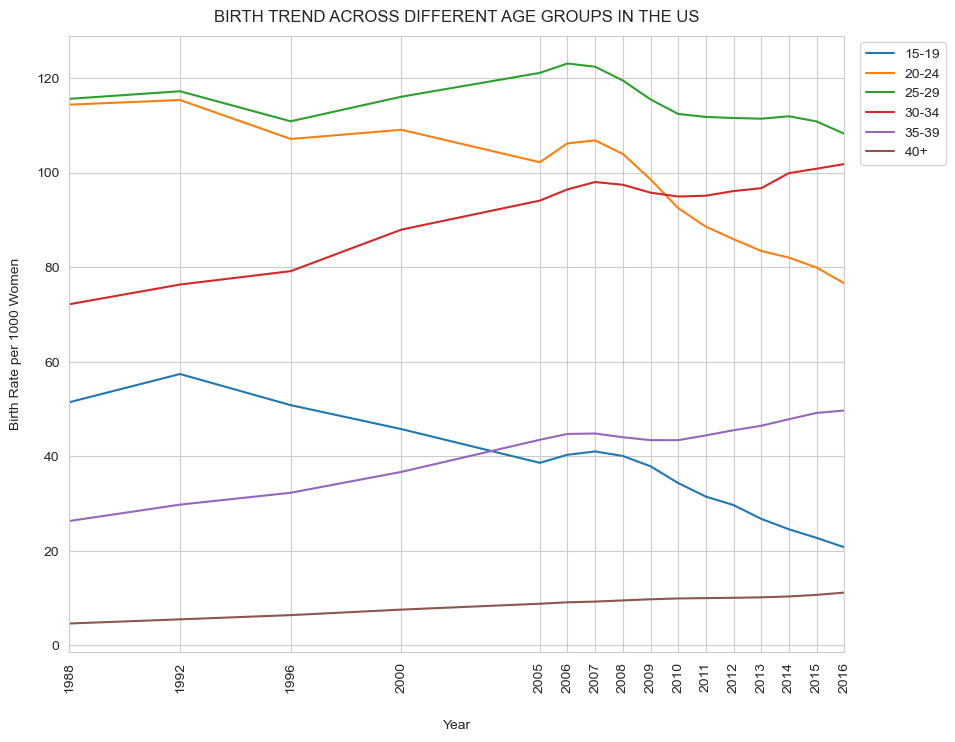

In [26]:
plot_metric_trend(birth_df, "birth")

For this section where we will compare abortion, pregnancy and birth rates per state, we will remove data for 1988, 1992 and 1996 from the abortion rate and pregnancy rate dataframes:

In [27]:
new_years = years[3:]
new_years

[2000, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016]

In [28]:
state_abortions = abortion_df[abortion_df["Year"].isin(new_years)].groupby("State")["Rate"].mean().to_frame().sort_values(by="Rate", ascending=False)
state_abortions.reset_index(inplace=True)
state_abortions.head()

,State,Rate
0,NY,33.217949
1,NJ,30.923077
2,DC,27.064103
3,MD,25.710256
4,DE,24.279487


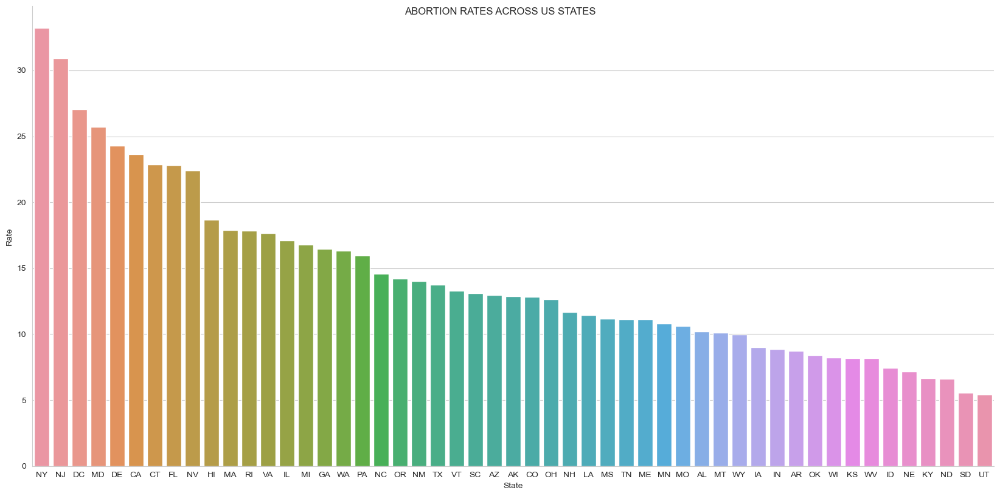

In [29]:
a = sns.catplot(x="State", y="Rate", data=state_abortions, kind="bar", height=8.27, aspect=2, ci=None)
a.fig.suptitle("ABORTION RATES ACROSS US STATES")
a;

In [30]:
state_pregnancies = pregnancy_df[pregnancy_df["Year"].isin(new_years)].groupby("State")["Rate"].mean().to_frame().sort_values(by="Rate", ascending=False)
state_pregnancies.reset_index(inplace=True)
state_pregnancies.head()

,State,Rate
0,NJ,111.057692
1,NY,108.833333
2,NV,106.196154
3,AK,105.552564
4,CA,105.356410


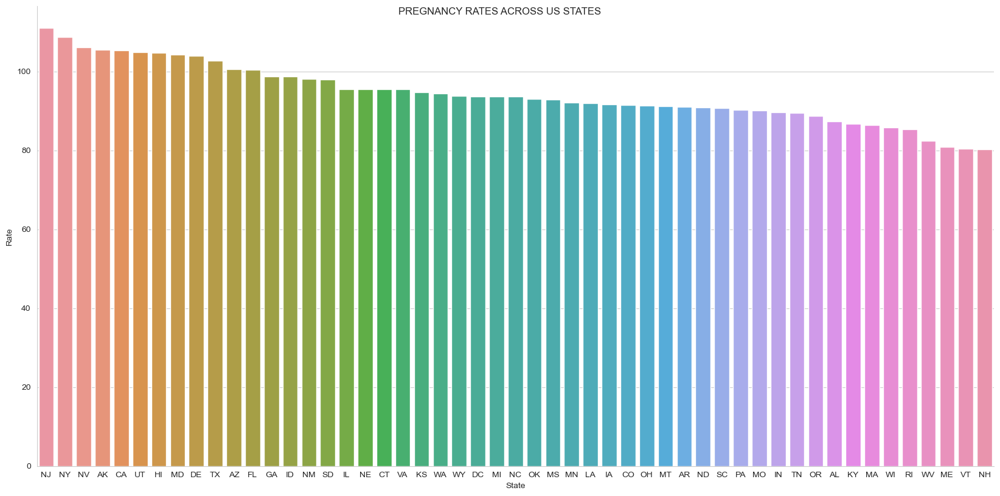

In [31]:
p = sns.catplot(x="State", y="Rate", data=state_pregnancies, kind="bar", height=8.27, aspect=2, ci=None)
p.fig.suptitle("PREGNANCY RATES ACROSS US STATES")
p;

In [32]:
state_births = birth_df.groupby("State")["Rate"].mean().to_frame().sort_values(by="Rate", ascending=False)
state_births.reset_index(inplace=True)
state_births.head()

,State,Rate
0,UT,83.048958
1,AK,77.403125
2,SD,75.490625
3,ID,75.375000
4,TX,73.134375


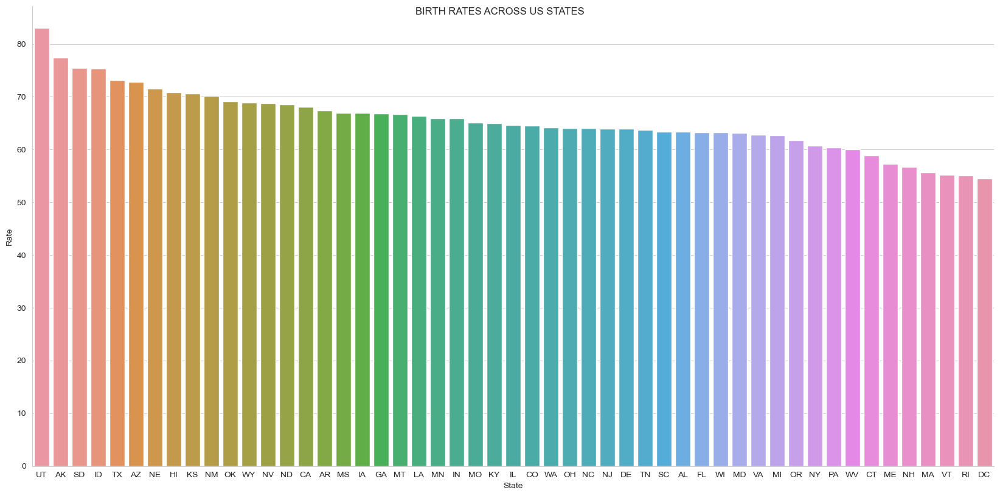

In [33]:
b = sns.catplot(x="State", y="Rate", data=state_births, kind="bar", height=8.27, aspect=2, ci=None)
b.fig.suptitle("BIRTH RATES ACROSS US STATES")
b;

Tables showing pregnancy, abortion and birth rates for each state in different years:

In [34]:
state_year_pregnancies = pregnancy_df.pivot_table(values="Rate", columns="State", index="Year")
state_year_pregnancies.columns.name = None
state_year_pregnancies.head()

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Year,,,,,,,,,,,,,,,,,,,,,
1988,121.233333,95.783333,93.250000,119.516667,136.333333,101.616667,103.883333,NaN,104.133333,110.066667,...,93.583333,89.816667,111.500000,117.116667,99.466667,93.300000,108.116667,88.966667,75.766667,97.350000
1992,130.533333,96.883333,97.183333,119.700000,144.366667,105.733333,103.833333,NaN,106.566667,110.716667,...,98.333333,93.116667,114.883333,110.366667,101.950000,88.016667,114.366667,89.716667,80.700000,99.316667
1996,114.450000,92.366667,93.883333,113.883333,128.333333,97.666667,100.633333,NaN,92.533333,112.150000,...,92.283333,89.183333,111.466667,109.233333,95.666667,83.166667,103.416667,86.500000,75.900000,95.916667
2000,109.166667,96.033333,94.583333,114.200000,120.900000,99.033333,101.400000,103.816667,105.733333,115.383333,...,91.933333,95.033333,113.683333,111.616667,99.900000,79.550000,102.900000,89.183333,79.650000,101.333333
2005,108.666667,90.150000,93.666667,114.916667,115.133333,101.583333,105.066667,109.716667,107.516667,108.133333,...,100.016667,93.733333,111.766667,111.850000,100.700000,83.966667,97.633333,90.650000,81.600000,99.466667


In [35]:
state_year_abortions = abortion_df.pivot_table(values="Rate", columns="State", index="Year")
state_year_abortions.columns.name = None
state_year_abortions.head()

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Year,,,,,,,,,,,,,,,,,,,,,
1988,20.916667,20.233333,14.433333,26.116667,44.466667,22.350000,30.933333,NaN,27.616667,28.066667,...,9.000000,17.033333,23.366667,11.050000,26.233333,21.483333,28.450000,16.066667,11.466667,13.166667
1992,22.333333,18.133333,16.383333,24.266667,42.783333,23.600000,28.100000,NaN,28.250000,27.950000,...,8.933333,16.366667,22.450000,8.383333,25.200000,16.583333,29.933333,14.566667,11.216667,14.050000
1996,18.683333,15.416667,12.116667,20.533333,34.516667,19.650000,25.216667,NaN,18.350000,31.750000,...,7.650000,13.983333,20.100000,7.433333,21.900000,16.616667,23.066667,13.566667,8.800000,15.966667
2000,14.766667,13.766667,10.633333,17.116667,32.100000,13.966667,24.266667,38.016667,23.666667,32.000000,...,6.683333,14.316667,18.616667,6.216667,20.416667,12.633333,21.966667,11.350000,8.133333,20.700000
2005,15.166667,11.416667,9.150000,16.433333,26.750000,15.050000,26.666667,41.616667,23.683333,25.133333,...,6.383333,12.550000,16.950000,6.066667,19.316667,15.150000,18.283333,9.816667,7.816667,11.883333


In [36]:
state_year_births = birth_df.pivot_table(values="Rate", columns="Year", index="State")
state_year_births.columns.name = None
state_year_births.head()

,1988,1992,1996,2000,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
State,,,,,,,,,,,,,,,,
AK,81.833333,88.333333,78.233333,77.433333,76.633333,79.166667,78.883333,81.233333,78.633333,77.750000,76.100000,73.250000,73.733333,73.150000,72.533333,71.550000
AL,61.266667,64.116667,62.816667,67.400000,64.650000,66.916667,68.133333,67.383333,64.833333,62.150000,61.216667,60.083333,59.616667,60.916667,61.216667,60.800000
AR,64.450000,65.950000,67.116667,69.066667,69.666667,72.000000,72.383333,70.883333,69.000000,66.433333,66.233333,65.300000,64.366667,65.383333,66.000000,64.833333
AZ,75.650000,77.500000,76.066667,79.483333,80.700000,83.400000,82.333333,78.466667,72.966667,68.700000,66.616667,66.583333,65.216667,65.283333,63.400000,61.850000
CA,72.866667,81.050000,75.316667,71.300000,71.416667,73.016667,73.350000,70.966667,67.333333,64.733333,63.150000,62.866667,61.166667,61.550000,59.700000,58.916667


In [37]:
states = ["Alabama", "Alaska", "Arizona", "Arkansas", "California", "Colorado", "Connecticut", "Delaware", "Washington, D.C.", "Florida", "Georgia", "Hawaii",
          "Idaho", "Illinois", "Indiana", "Iowa", "Kansas", "Kentucky", "Louisiana", "Maine", "Maryland", "Massachusetts", "Michigan", "Minnesota",
          "Mississippi", "Missouri", "Montana", "Nebraska", "Nevada", "New Hampshire", "New Jersey", "New Mexico", "New York", "North Carolina", "North Dakota",
          "Ohio", "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas", "Utah", "Vermont", "Virginia",
          "Washington", "West Virginia", "Wisconsin", "Wyoming"]
len(states)

51

In [38]:
rcParams.update({'figure.max_open_warning': 0})

**To view metric trend per state**

In [39]:
# fn to view metric trend per state
def metric_trend_per_state(df, metric):
  """
    df(DataFrame): abortion_df, pregnancy_df or birth_df
    metric(str): "abortion", "pregnancy" or "birth"
  """
  for lab, state in enumerate(df["State"].unique()):
    table1 = df[df["State"] == state]
    metric_per_state = table1.pivot_table(values="Rate", columns="Age Range", index="Year")
    metric_per_state.plot(figsize=(10, 8))
    plt.xticks(years, rotation=90)
    plt.xlim([1988, 2016])
    plt.xlabel("Year", labelpad=20)
    plt.ylabel(f"{metric.title()} Rate per 1000 Women", labelpad=10)
    plt.legend(loc="upper right", bbox_to_anchor=(1.14, 1))
    plt.title(f"Trend in {metric.lower()} rate in {states[lab]} among differnt age groups from 1988–2016", pad=10)
    plt.show()

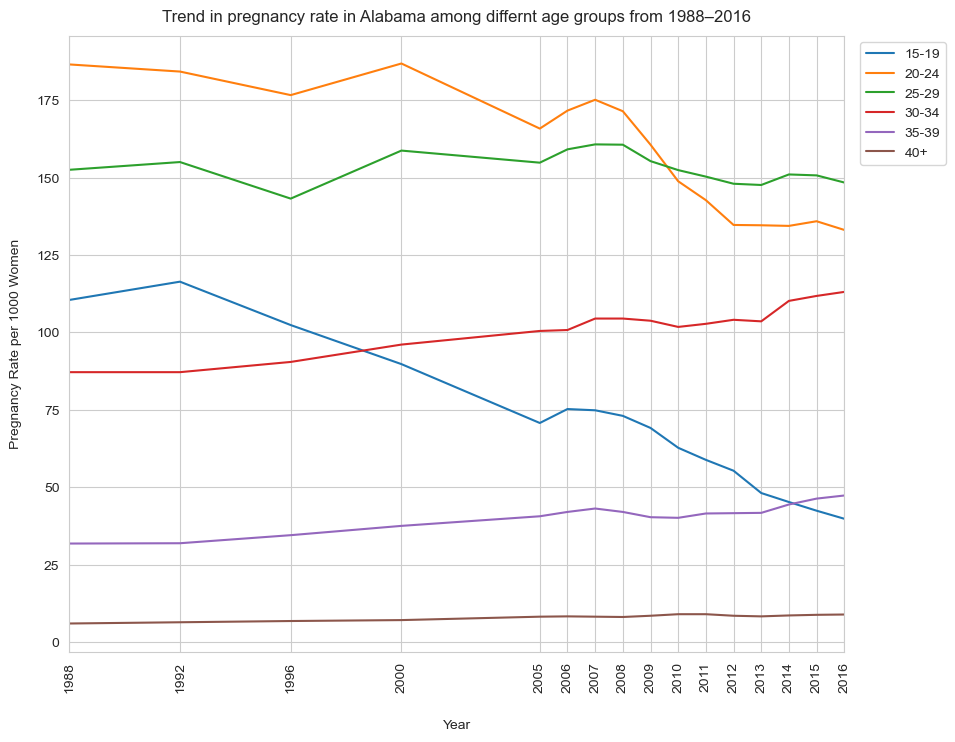

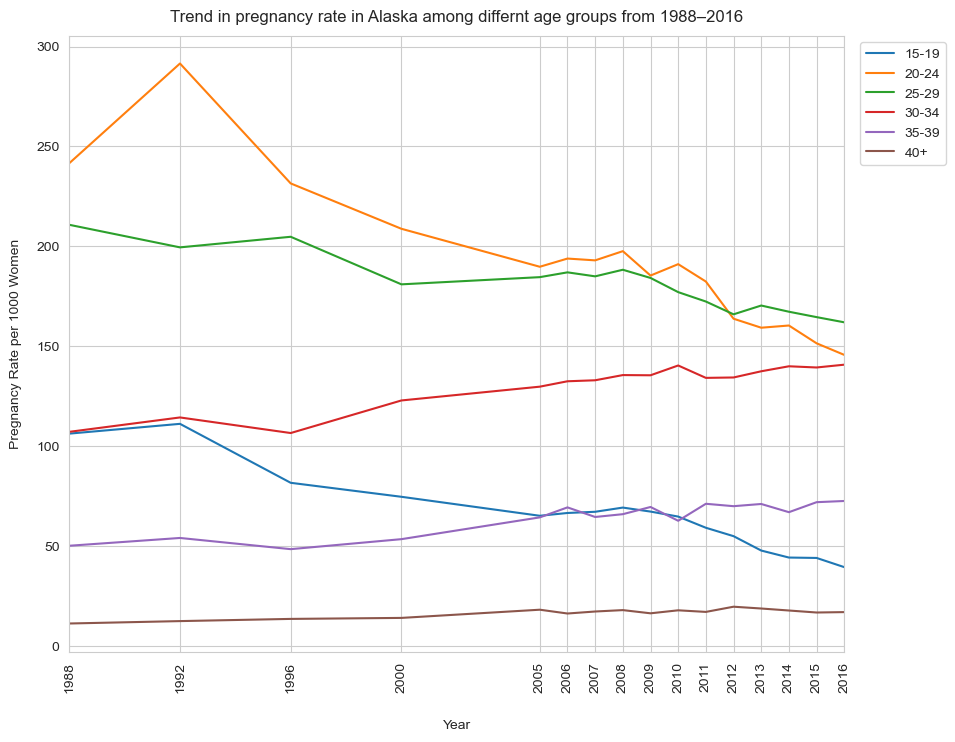

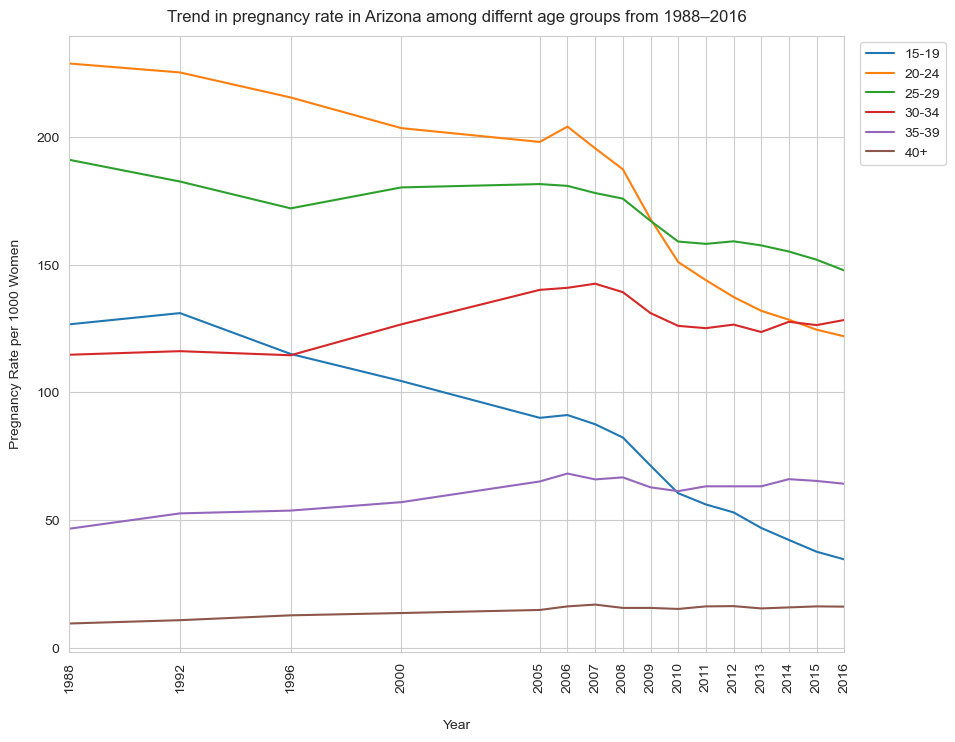

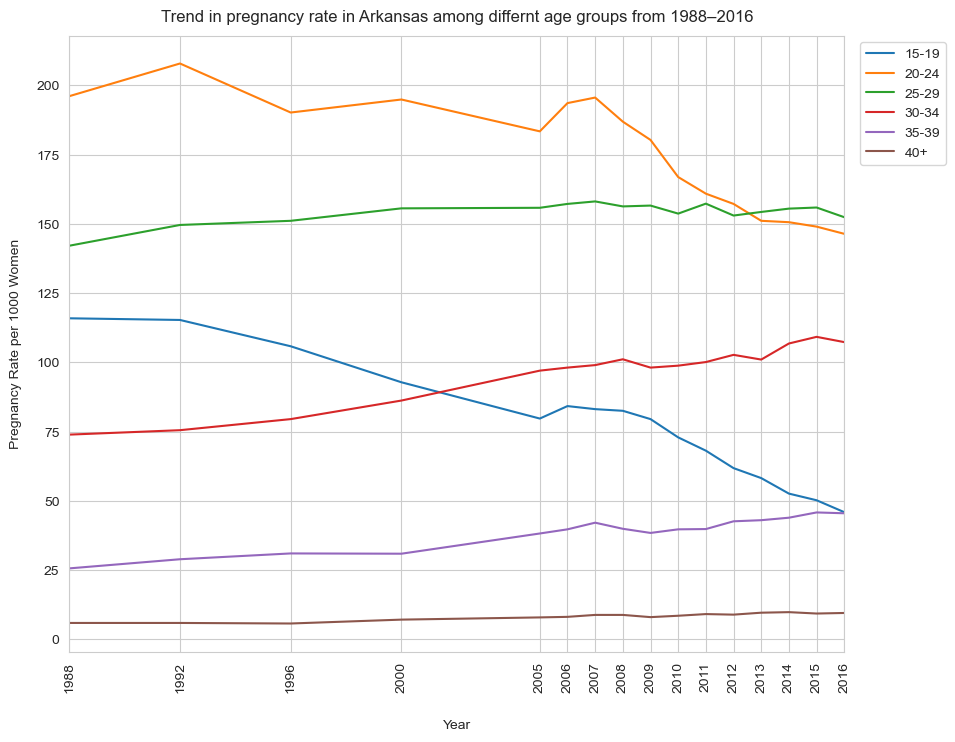

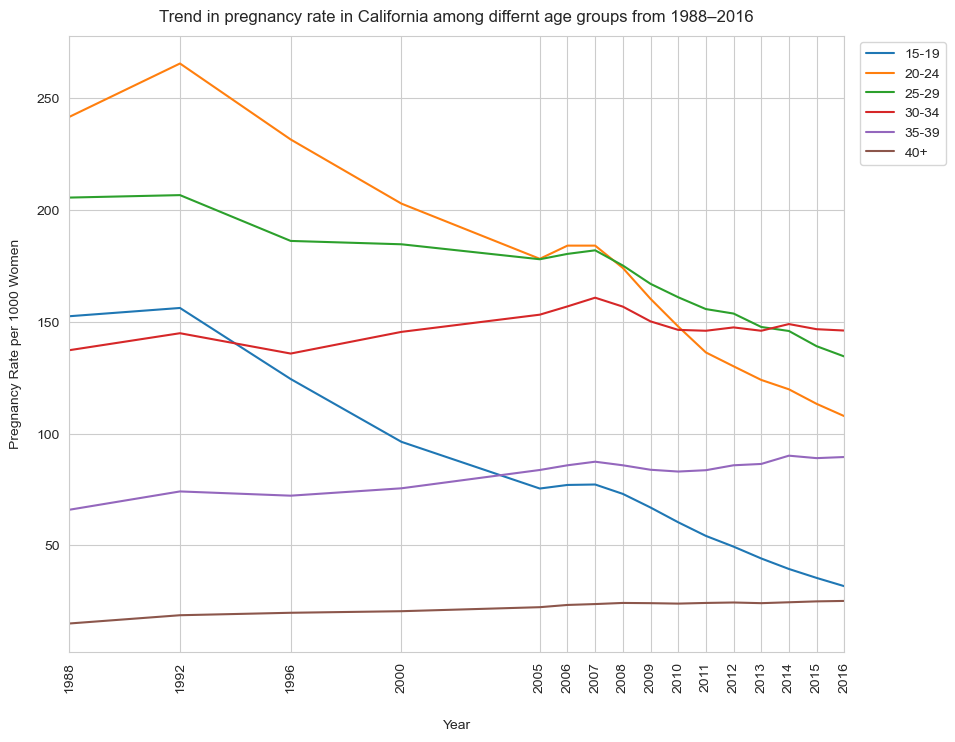

...

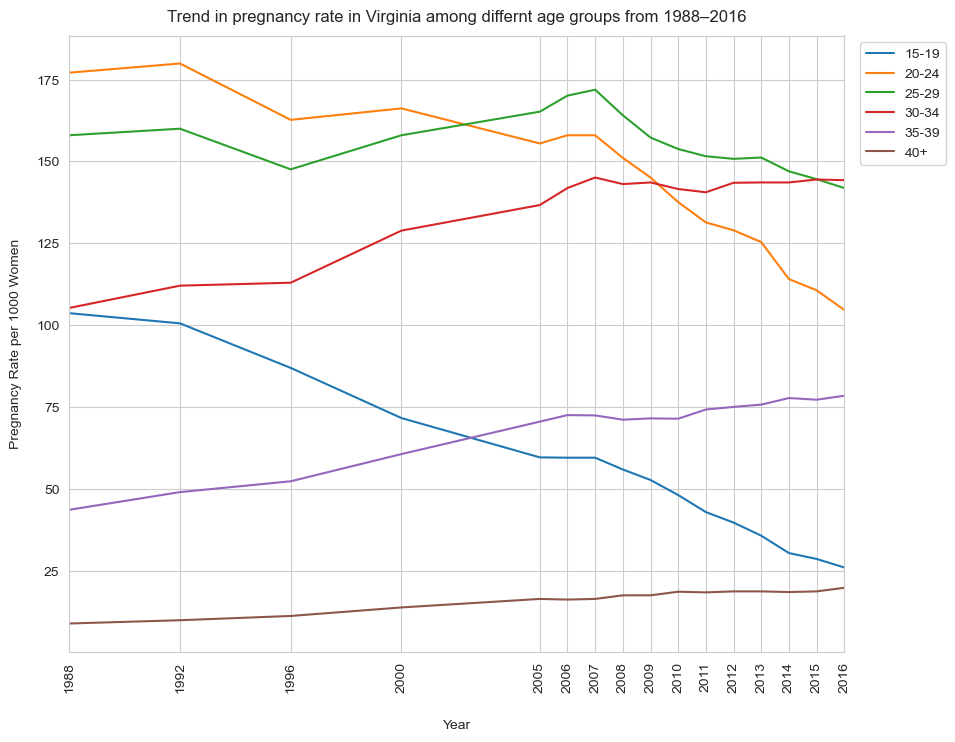

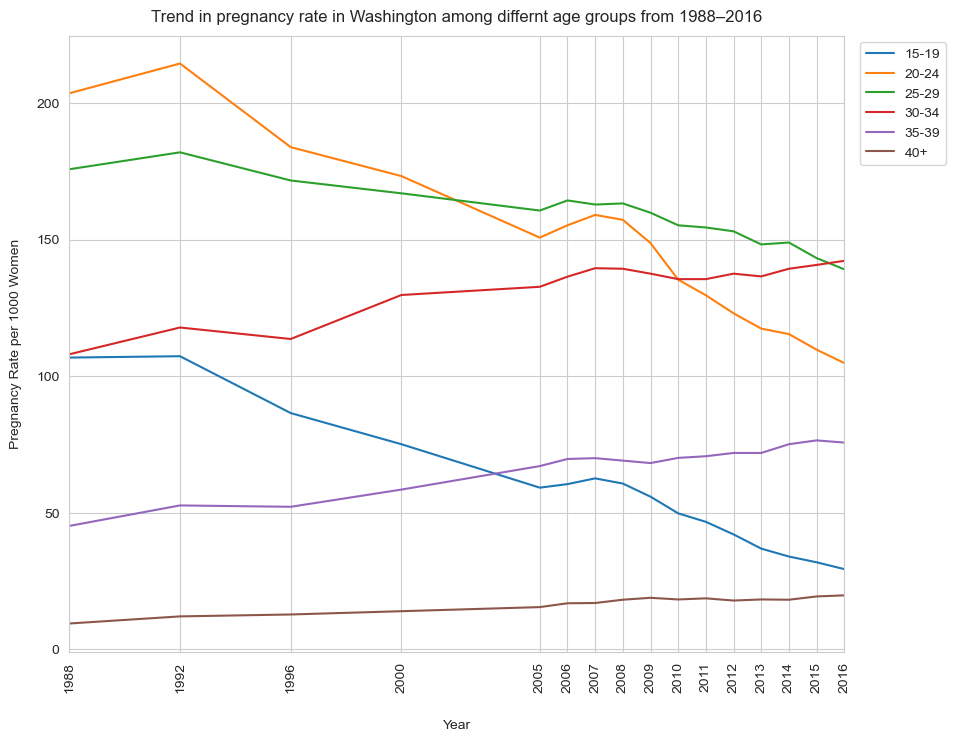

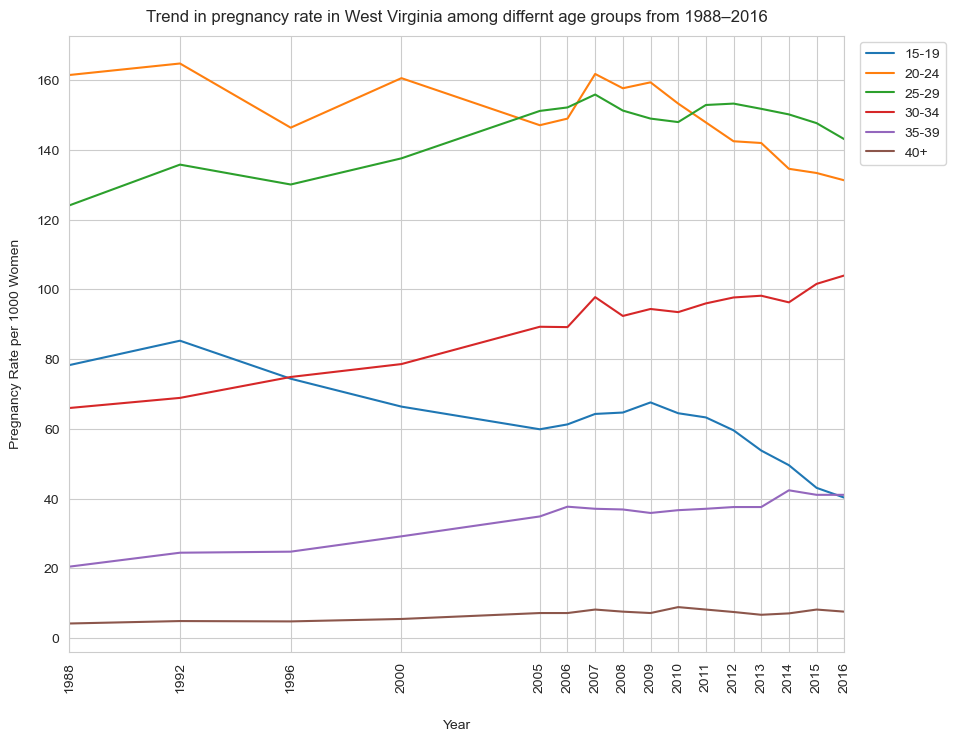

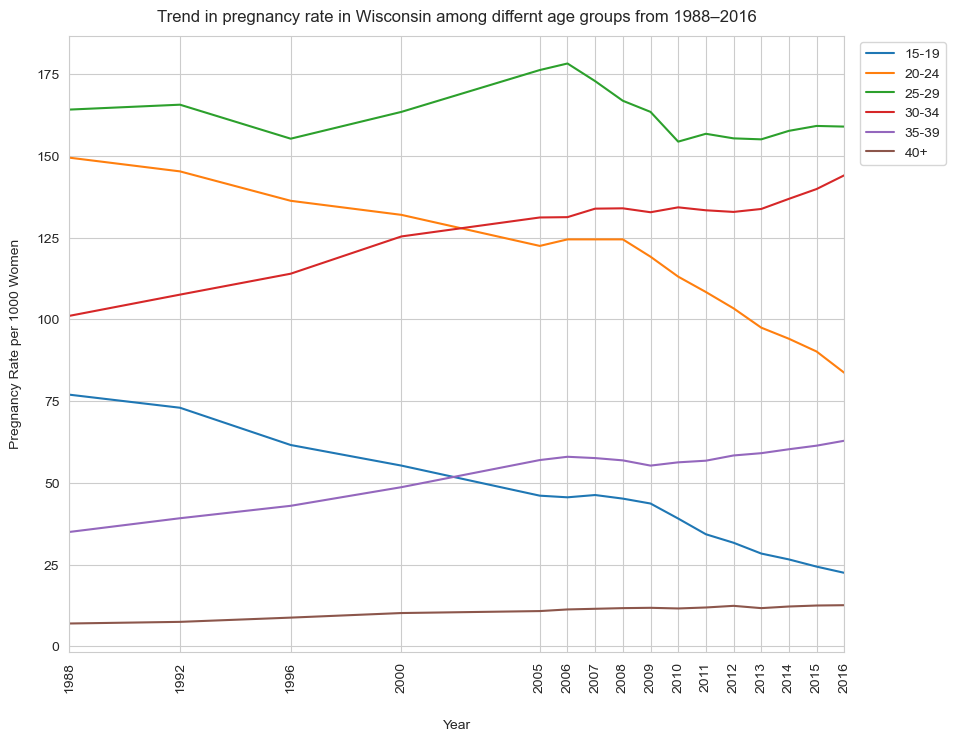

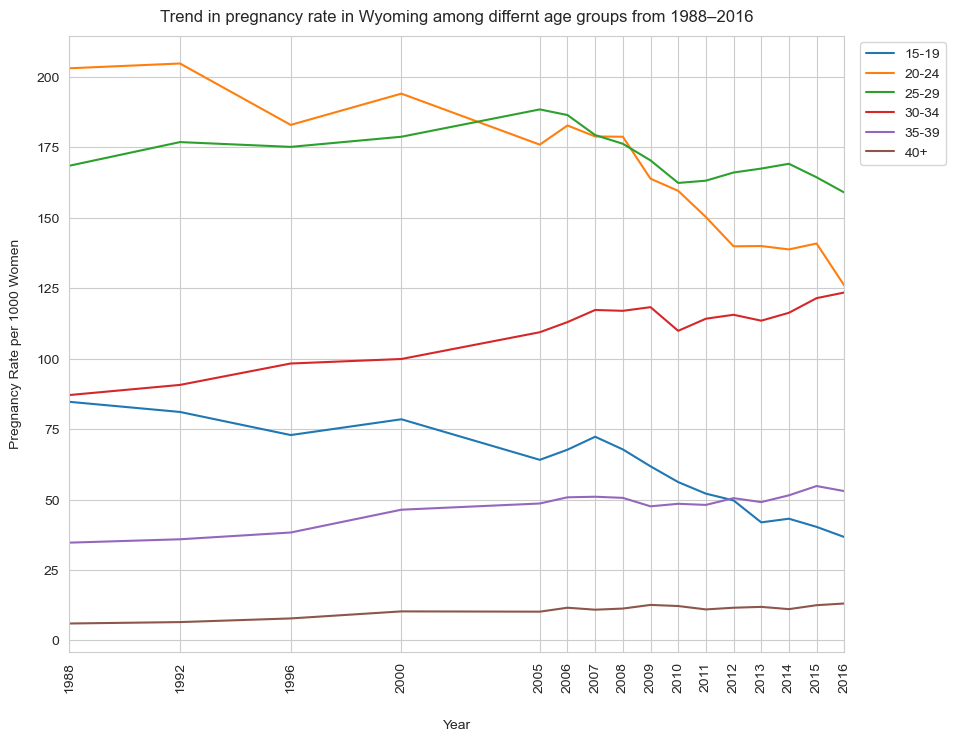

In [40]:
metric_trend_per_state(pregnancy_df, 'pregnancy')

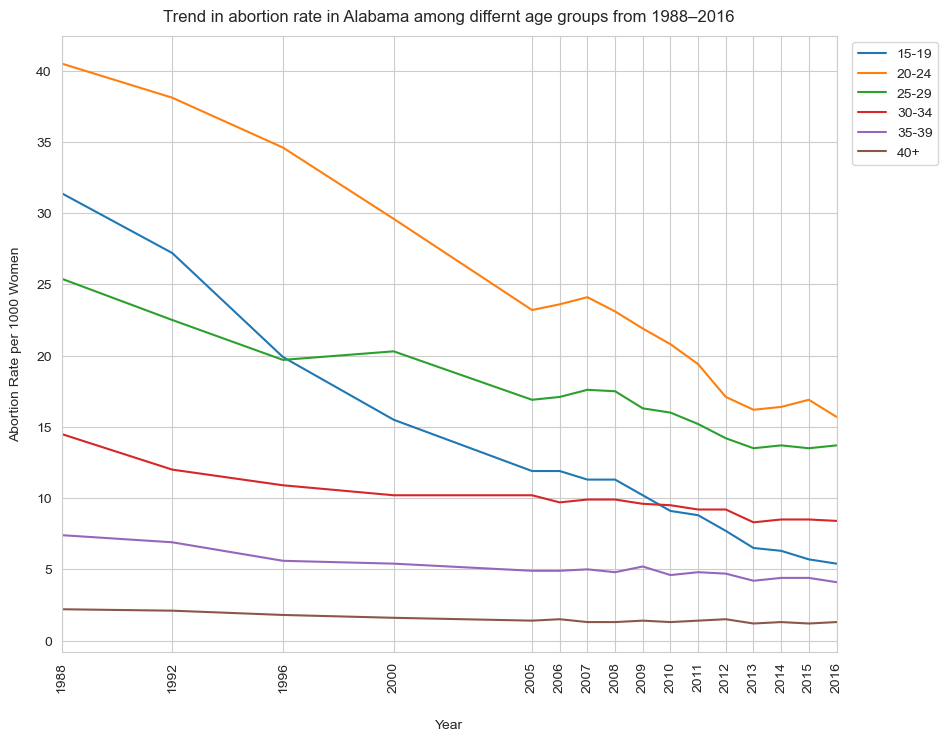

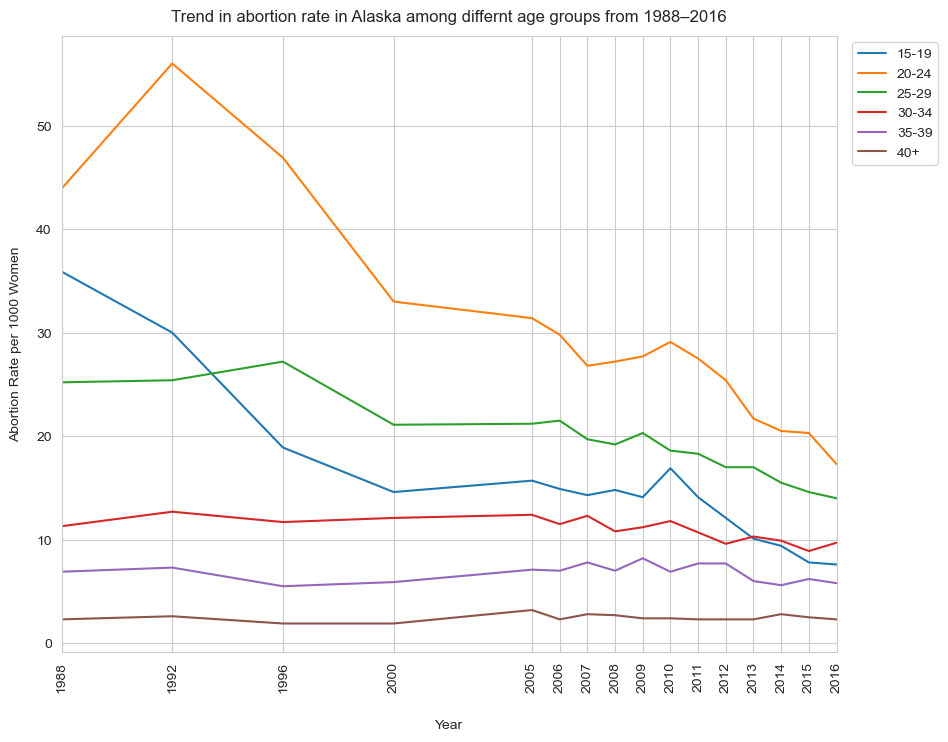

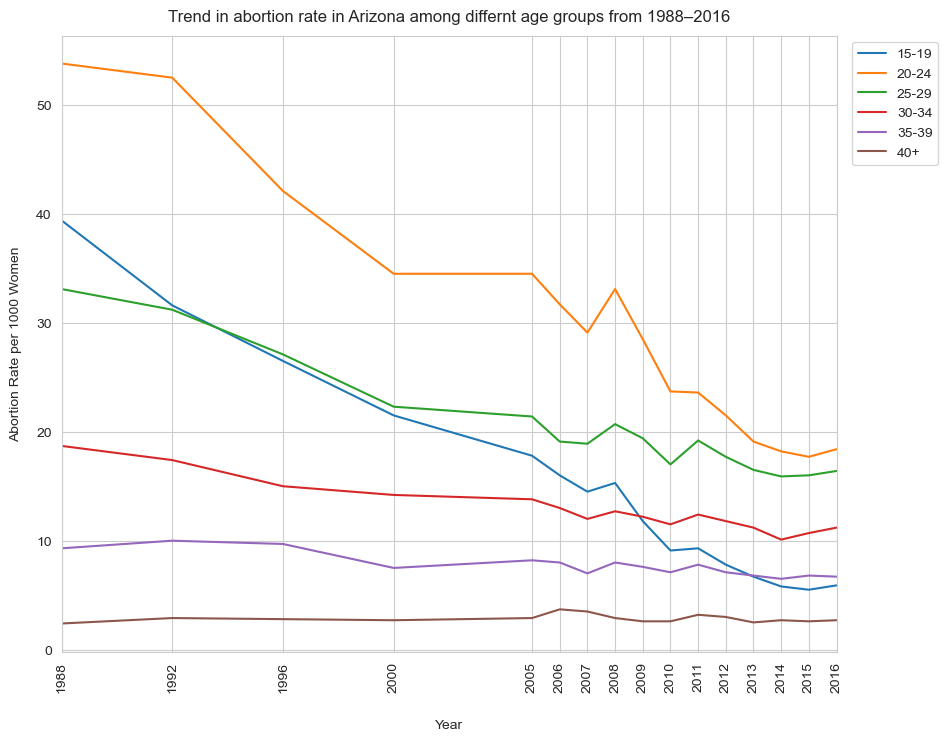

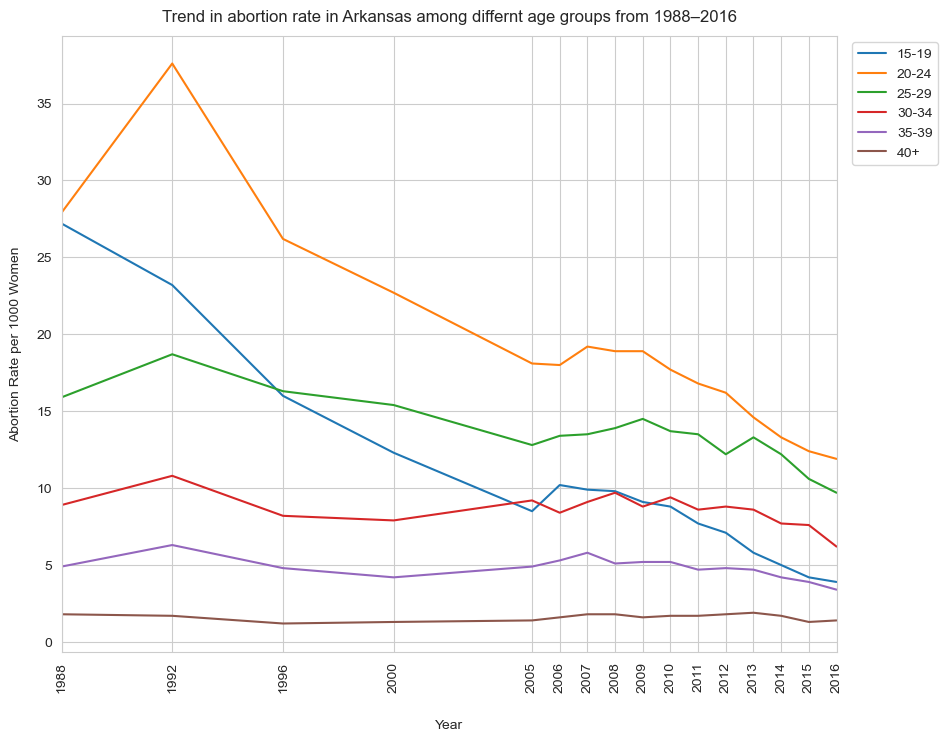

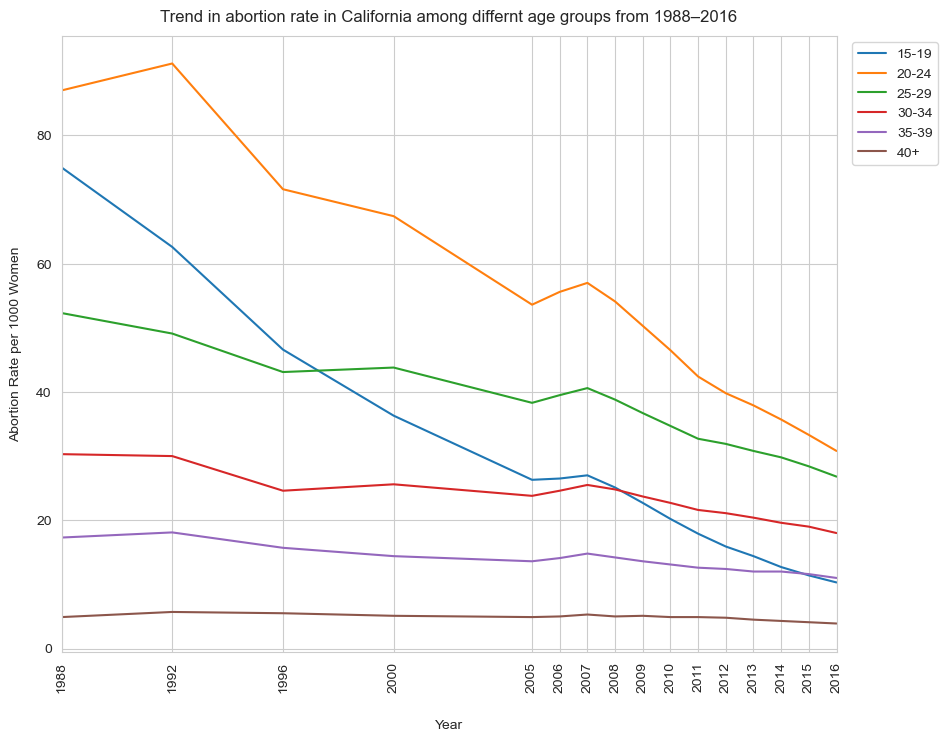

...

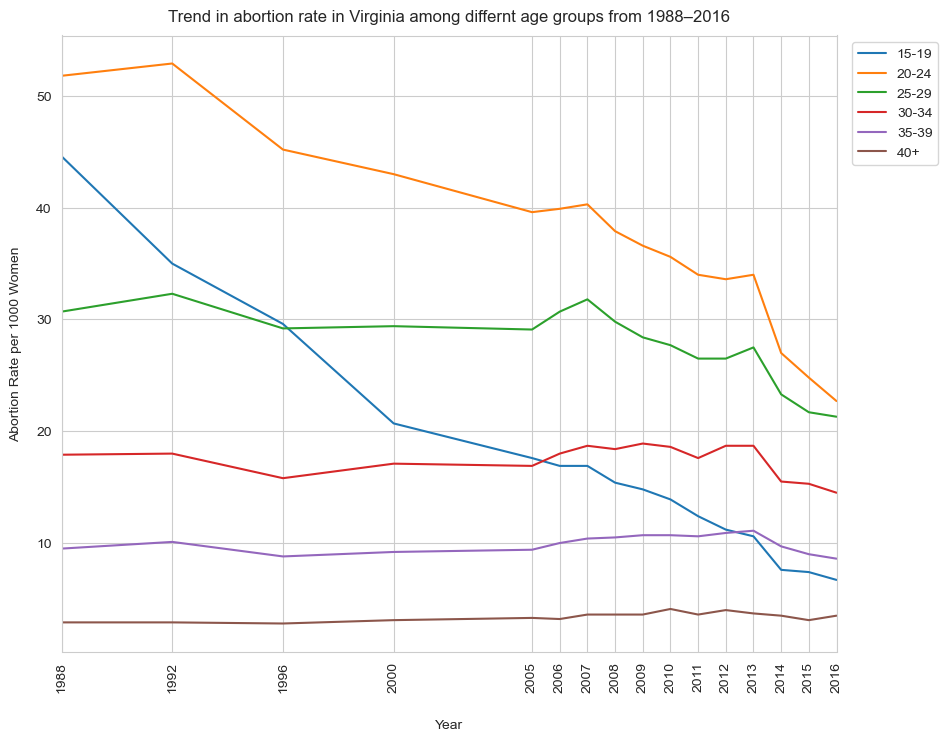

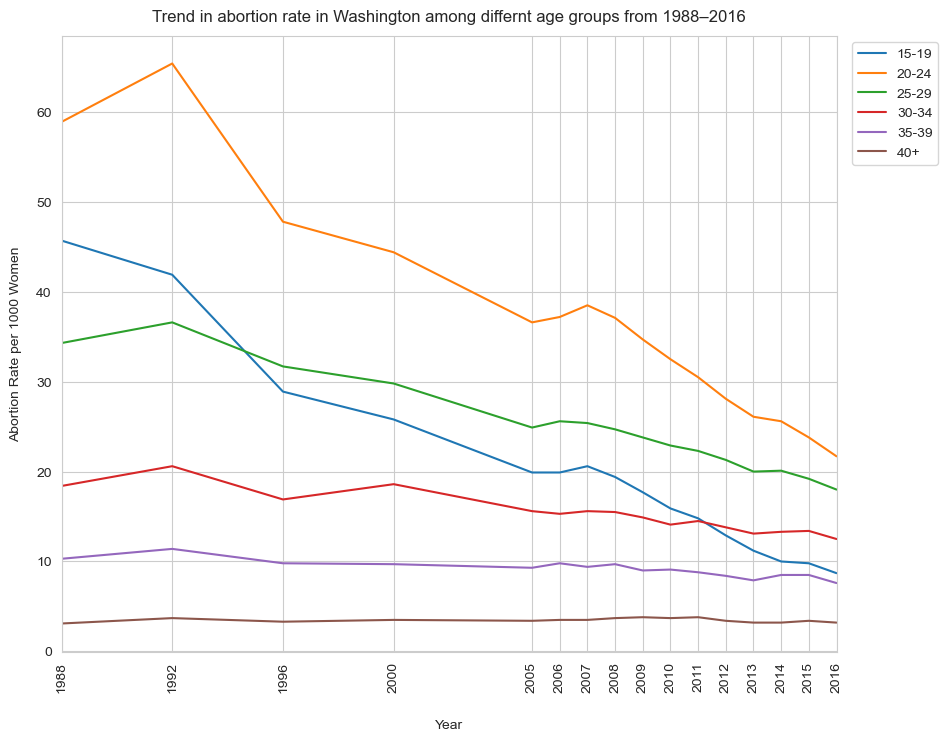

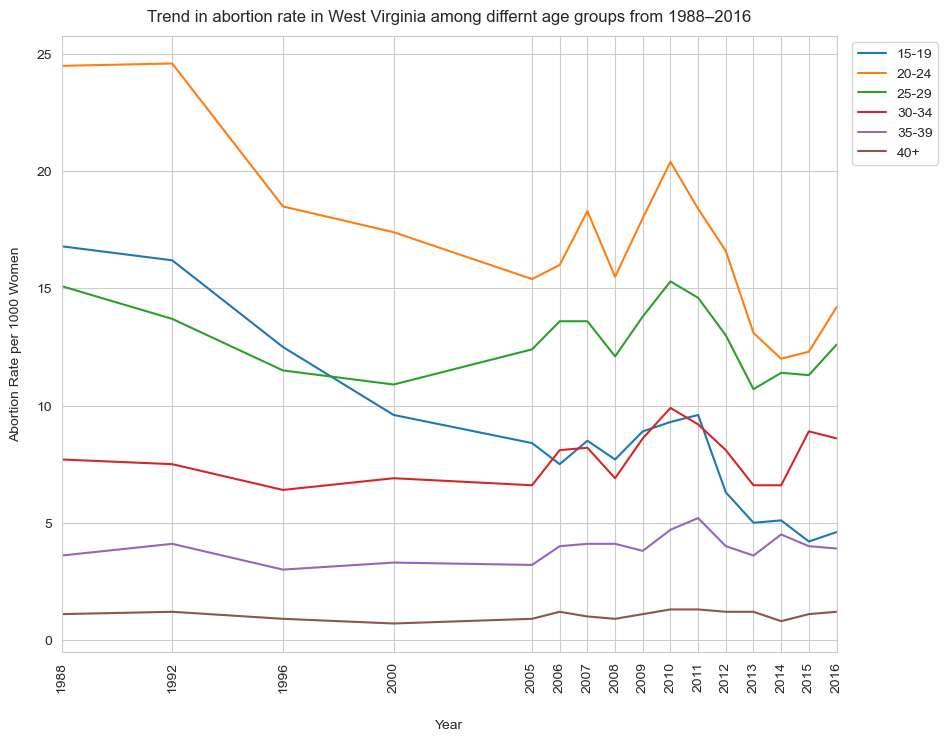

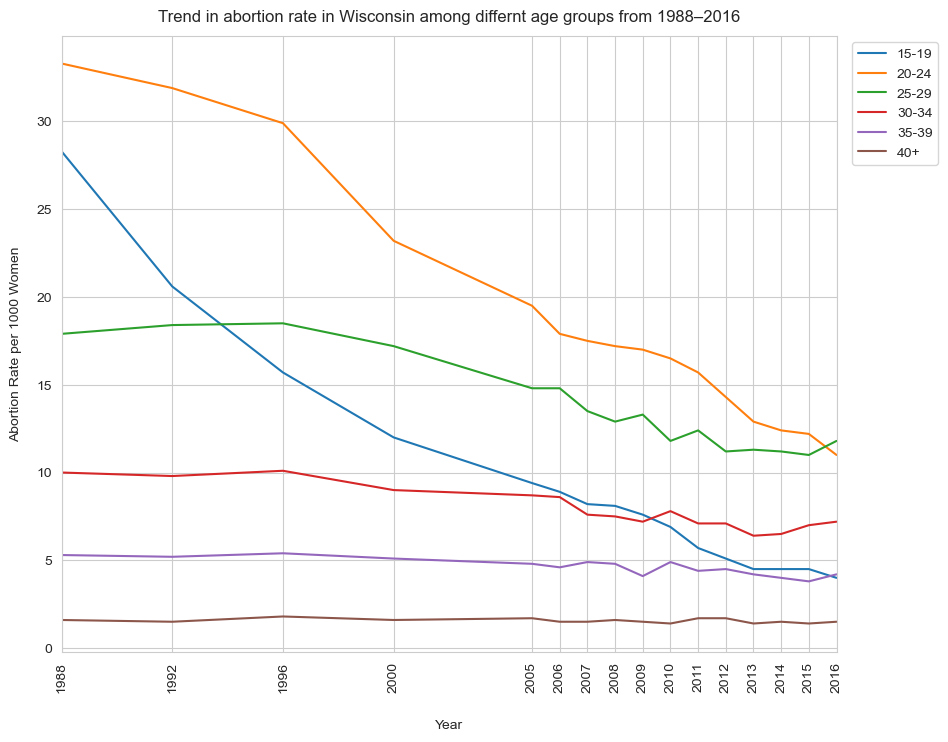

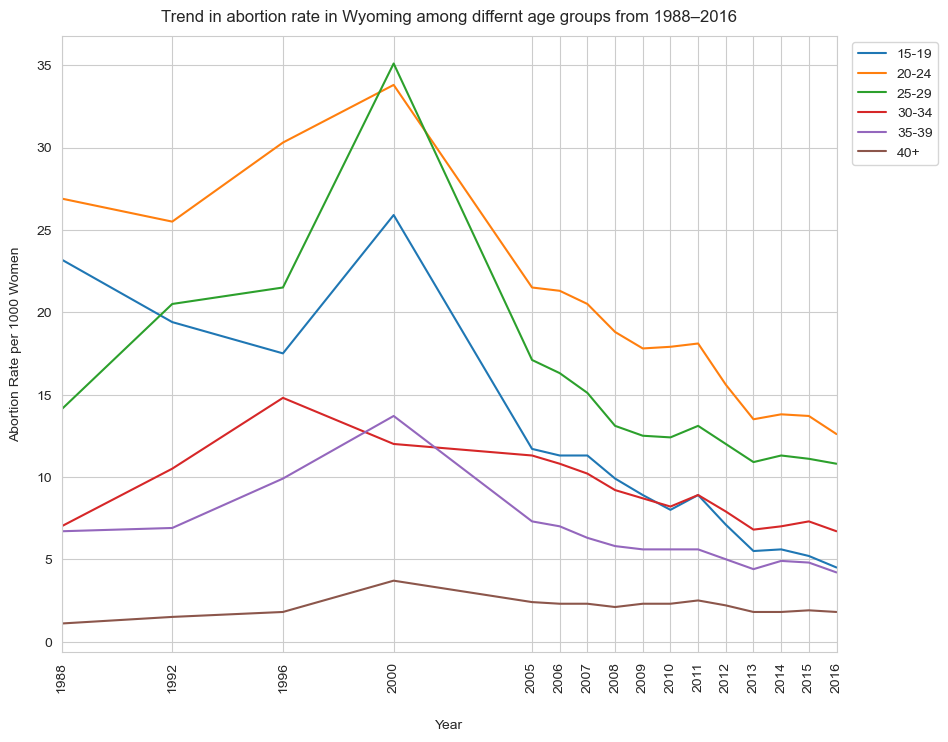

In [41]:
metric_trend_per_state(abortion_df, 'abortion')

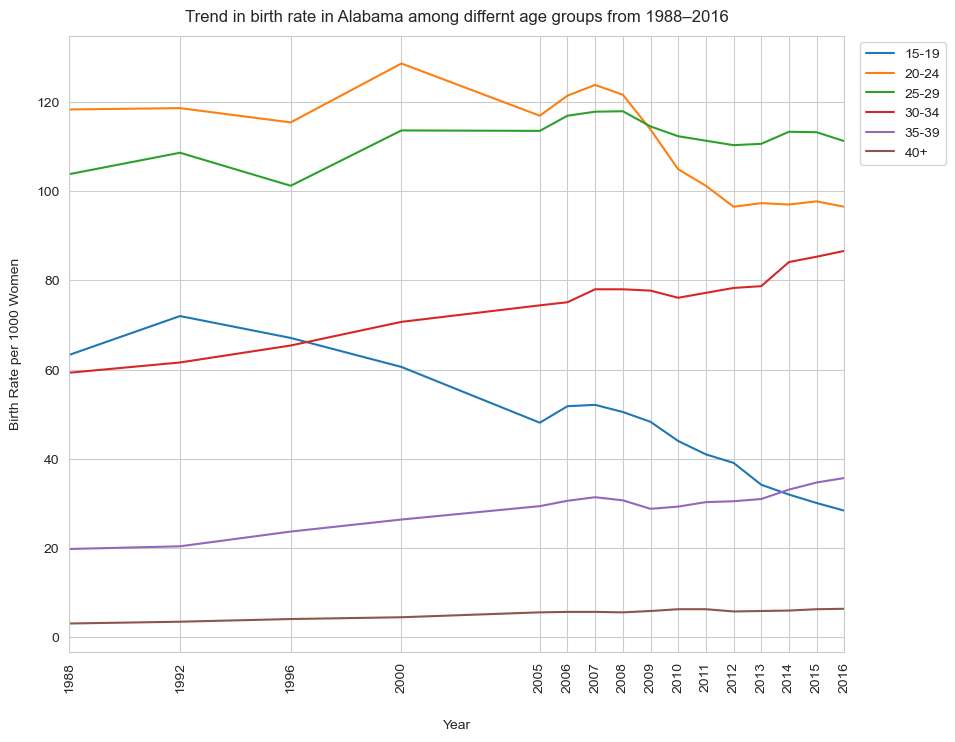

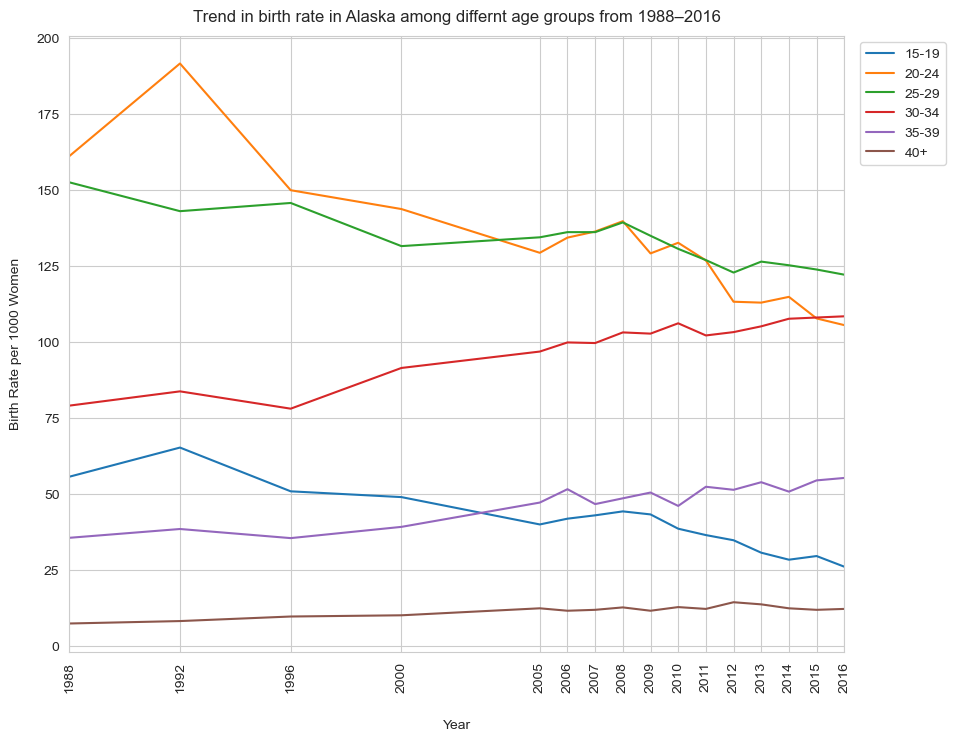

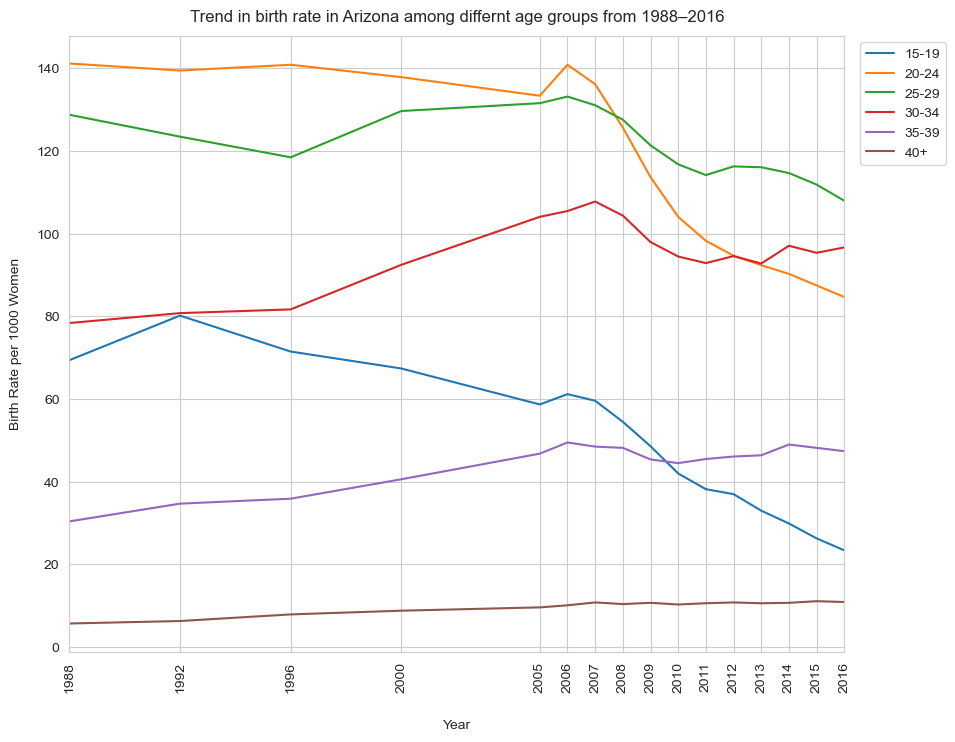

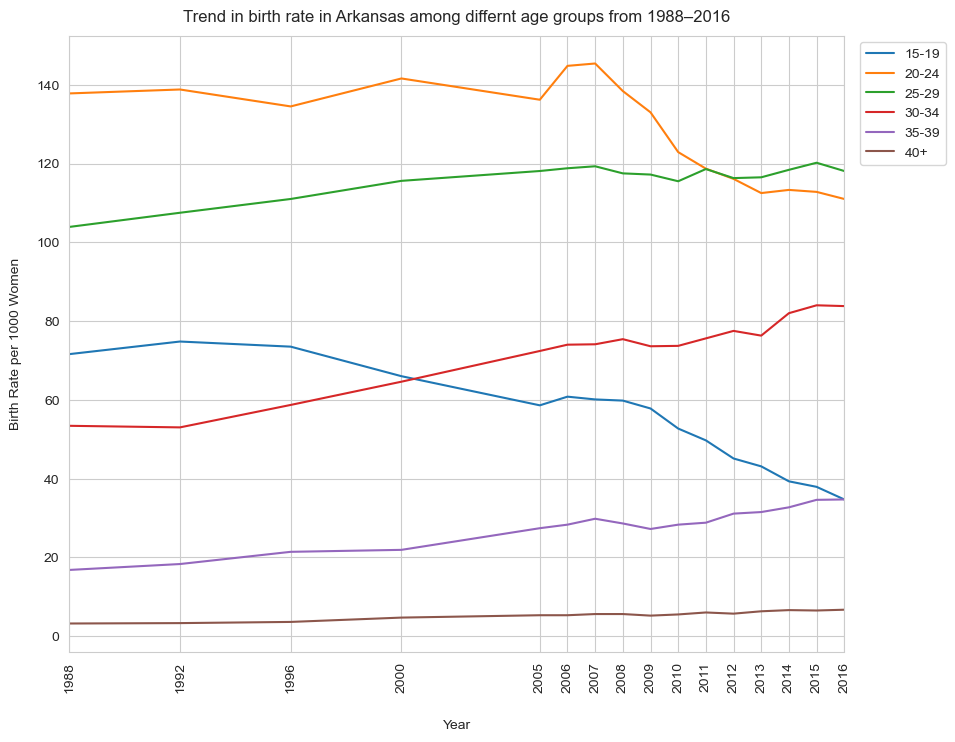

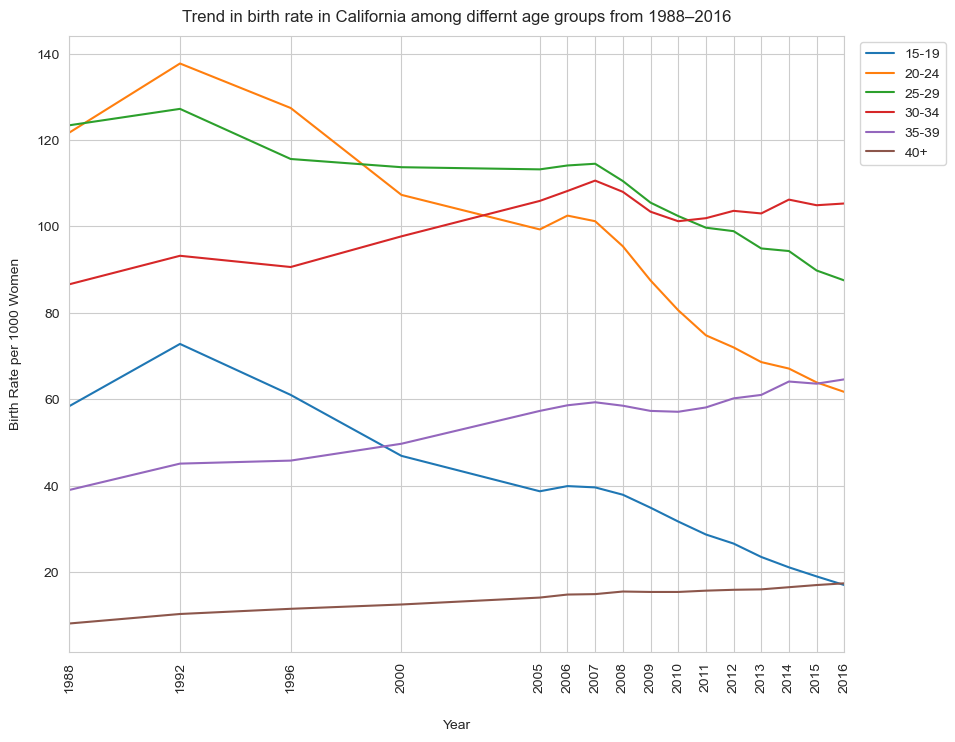

...

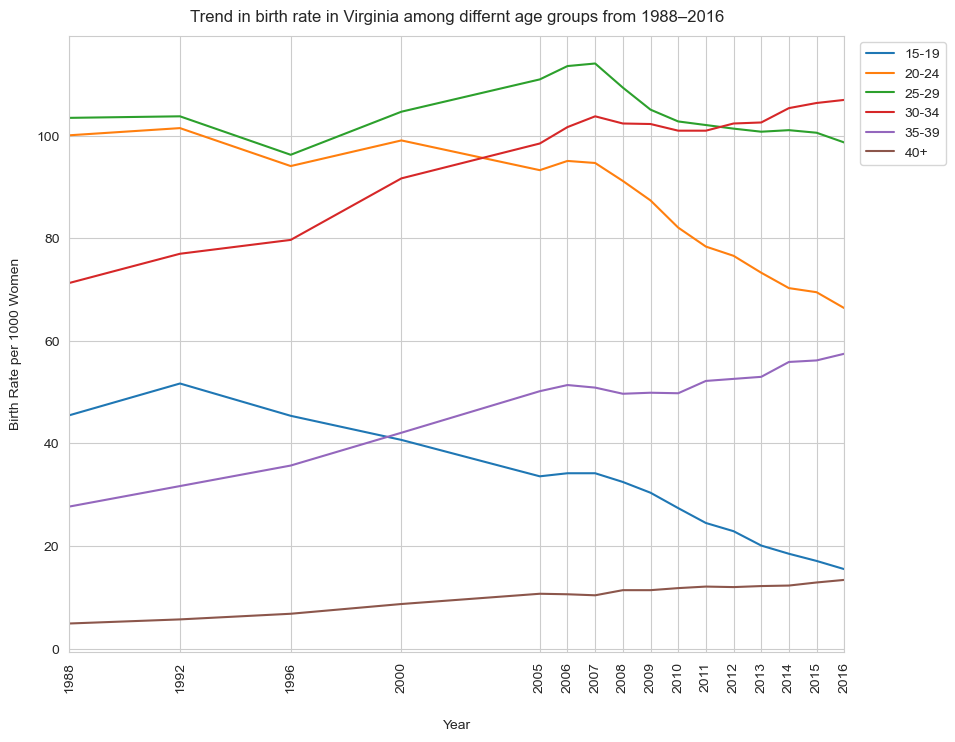

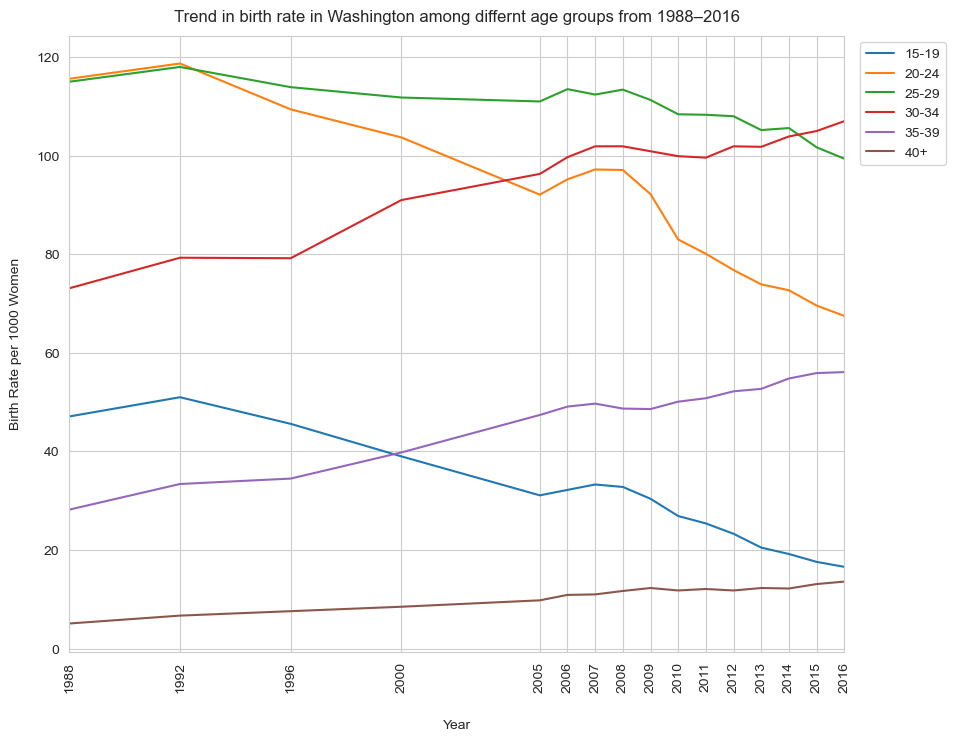

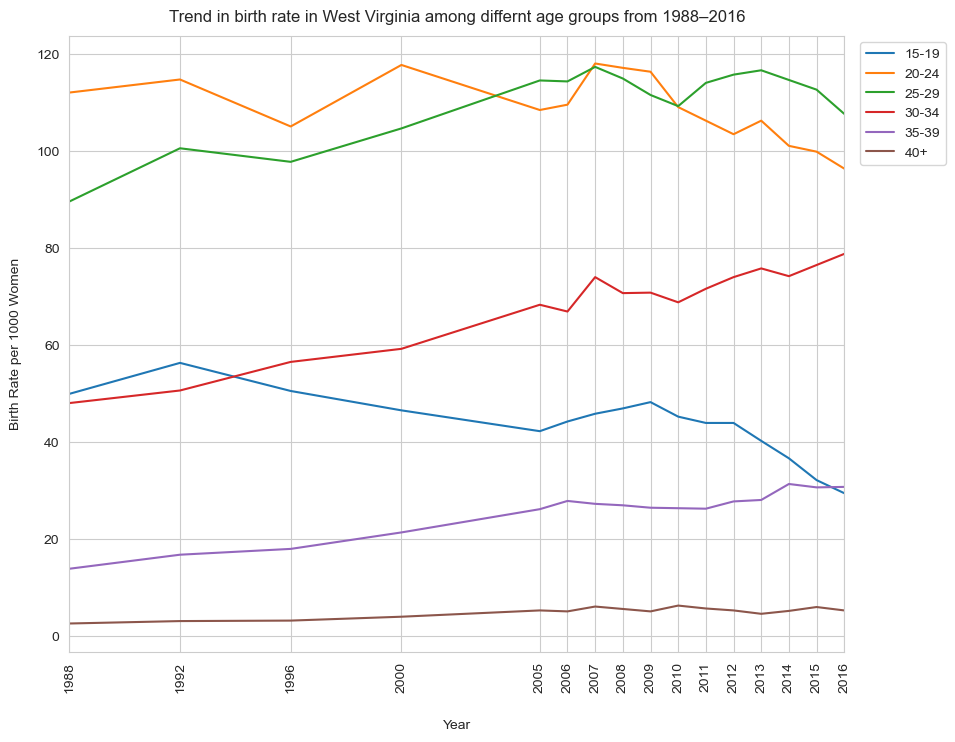

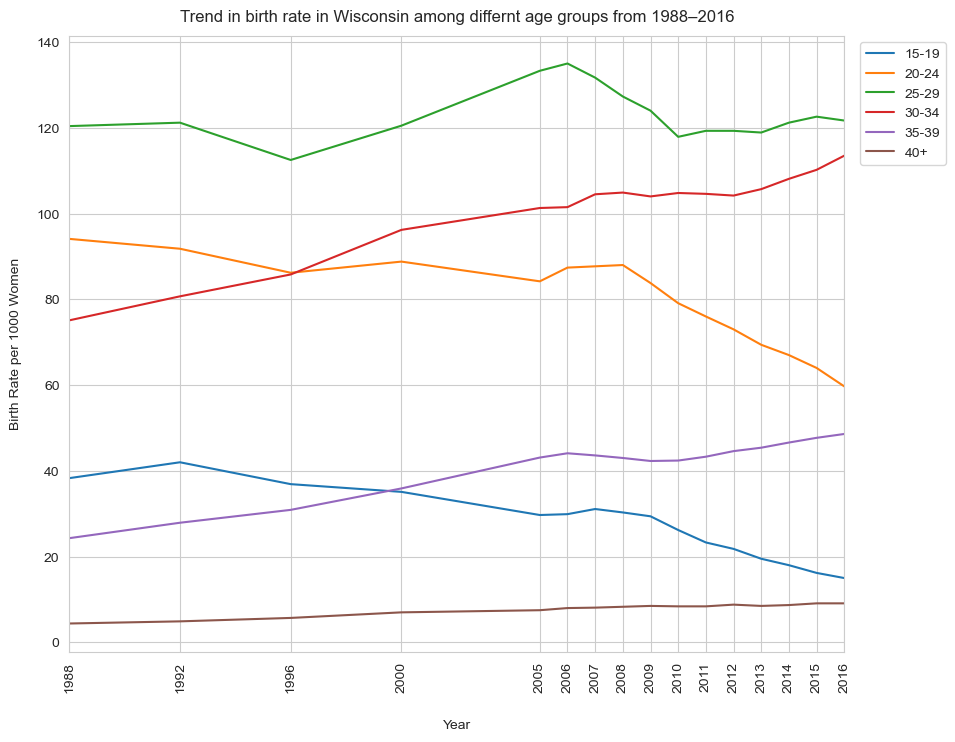

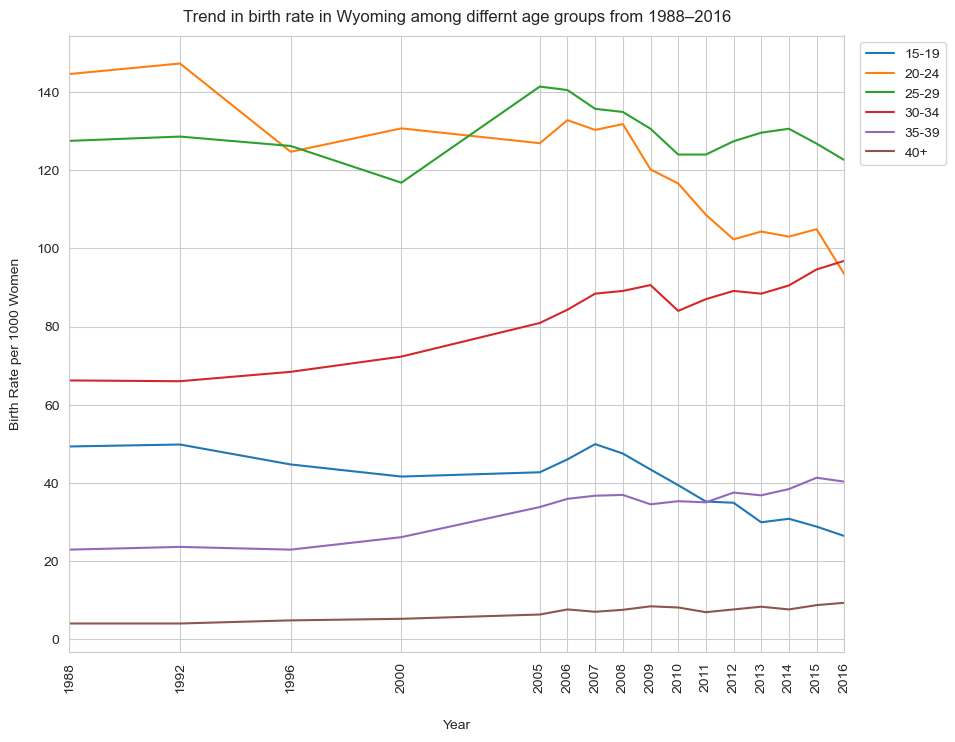

In [42]:
metric_trend_per_state(birth_df, 'birth')